<a href="https://colab.research.google.com/github/vlrhsgody/DeepLearning/blob/main/DL_VOC2007_Semantic_Segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

# module imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import random
import os
import tensorflow as tf
import tensorflow_datasets as tfds

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


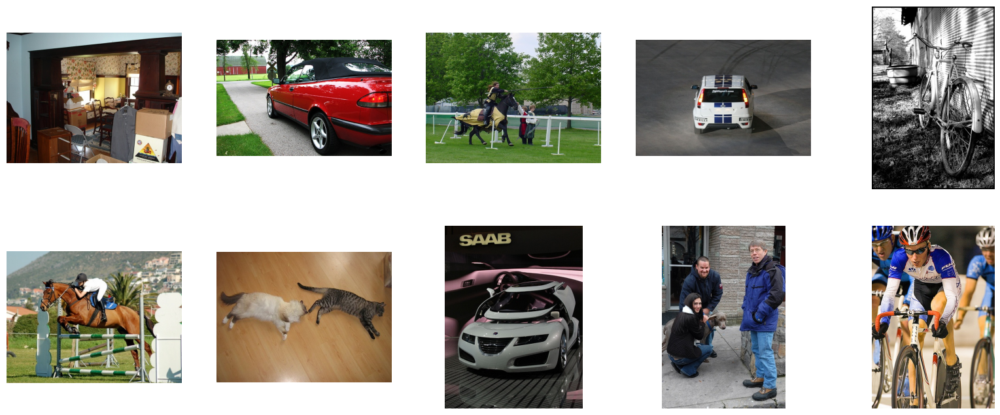

In [2]:
import os
import matplotlib.pyplot as plt

# 이미지 경로를 설정합니다.
image_dir = '/content/drive/MyDrive/VOC2007/JPEGImages/'

# 디렉터리 내 모든 이미지 파일 경로를 가져옵니다.
image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith('.jpg')]
image_paths.sort()

# 이미지 개수를 확인합니다.
num_images = min(10, len(image_paths))

# 이미지를 출력하는 부분
fig, axs = plt.subplots(2, 5, figsize=(20, 8))
for i in range(num_images):
    r = i // 5
    c = i % 5
    img = plt.imread(image_paths[i])
    axs[r][c].axis("off")
    axs[r][c].imshow(img)

plt.show()


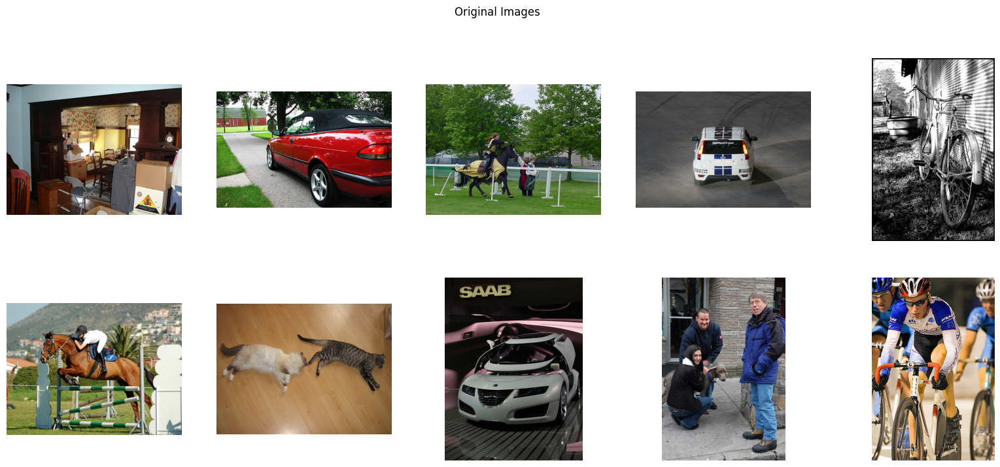

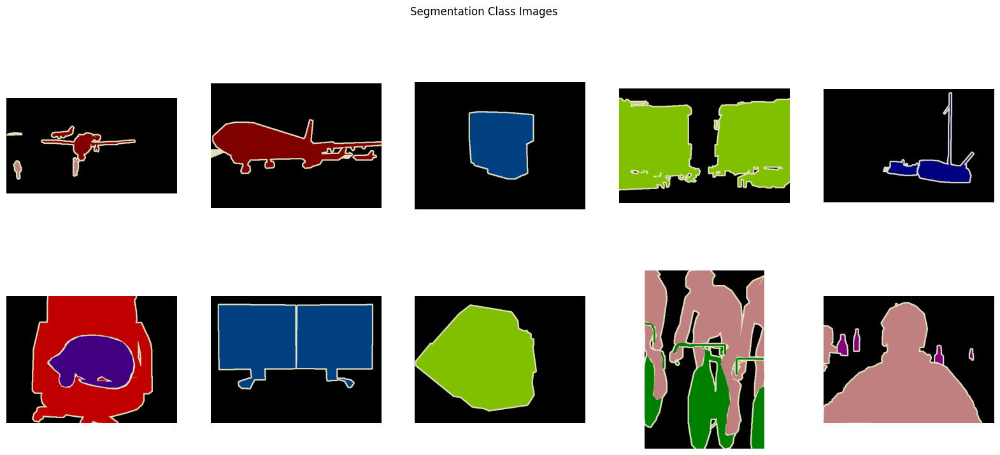

In [3]:
import os
import matplotlib.pyplot as plt

# 경로를 설정합니다.
image_dir = '/content/drive/MyDrive/VOC2007/JPEGImages/'
segmentation_dir = '/content/drive/MyDrive/VOC2007/SegmentationClass/'

# 디렉터리 내 모든 이미지 파일 경로를 가져옵니다.
image_paths = [os.path.join(image_dir, filename) for filename in os.listdir(image_dir) if filename.endswith('.jpg')]
image_paths.sort()

# 세그멘테이션 파일 경로를 가져옵니다.
segmentation_paths = [os.path.join(segmentation_dir, filename) for filename in os.listdir(segmentation_dir) if filename.endswith('.png')]
segmentation_paths.sort()

# 이미지 개수를 확인합니다.
num_images = min(10, len(image_paths), len(segmentation_paths))

# 원본 이미지를 출력하는 부분
fig1, axs1 = plt.subplots(2, 5, figsize=(20, 8))
for i in range(num_images):
    r = i // 5
    c = i % 5
    img = plt.imread(image_paths[i])
    axs1[r][c].axis("off")
    axs1[r][c].imshow(img)
fig1.suptitle('Original Images')
plt.show()

# 세그멘테이션 이미지를 출력하는 부분
fig2, axs2 = plt.subplots(2, 5, figsize=(20, 8))
for i in range(num_images):
    r = i // 5
    c = i % 5
    seg_img = plt.imread(segmentation_paths[i])
    axs2[r][c].axis("off")
    axs2[r][c].imshow(seg_img)
fig2.suptitle('Segmentation Class Images')
plt.show()


In [4]:
import os

def load_voc2007_data(base_path):
    image_paths = []
    mask_paths = []
    for dirname, _, filenames in os.walk(os.path.join(base_path, 'JPEGImages')):
        for filename in filenames:
            if filename.endswith('.jpg'):
                image_paths.append(os.path.join(dirname, filename))
                mask_path = os.path.join(base_path, 'SegmentationClass', filename.replace('.jpg', '.png'))
                if os.path.exists(mask_path):
                    mask_paths.append(mask_path)
                else:
                    mask_paths.append(None)

    valid_image_paths = []
    valid_mask_paths = []

    for image_path, mask_path in zip(image_paths, mask_paths):
        if mask_path:
            valid_image_paths.append(image_path)
            valid_mask_paths.append(mask_path)

    return valid_image_paths[:10], valid_mask_paths[:10]  # 10개의 데이터만 로드
# 데이터셋 경로 설정 및 데이터 로드
base_path = '/content/drive/MyDrive/VOC2007'
image_paths, mask_paths = load_voc2007_data(base_path)


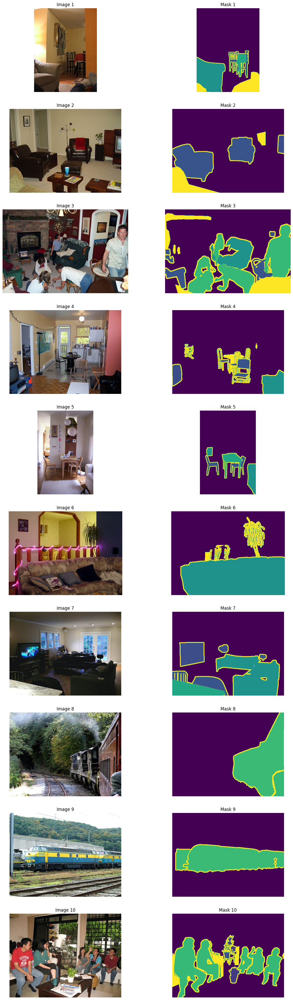

In [5]:
import tensorflow as tf
import matplotlib.pyplot as plt

# 로드한 데이터 시각화 함수
def visualize_loaded_data(image_paths, mask_paths):
    fig, axs = plt.subplots(10, 2, figsize=(15, 50))
    for i in range(10):
        if i < len(image_paths):
            # 이미지 로드 및 시각화
            image = tf.io.read_file(image_paths[i])
            image = tf.image.decode_jpeg(image, channels=3)
            axs[i, 0].imshow(image)
            axs[i, 0].set_title(f'Image {i+1}')
            axs[i, 0].axis('off')

            # 마스크 로드 및 시각화
            mask = tf.io.read_file(mask_paths[i])
            mask = tf.image.decode_png(mask, channels=1)
            axs[i, 1].imshow(mask)
            axs[i, 1].set_title(f'Mask {i+1}')
            axs[i, 1].axis('off')

    plt.show()

# 로드한 데이터 시각화
visualize_loaded_data(image_paths, mask_paths)


In [6]:
# 전처리 함수
def preprocess_image(image_path, mask_path, num_classes):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0

    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask, channels=1)
    mask = tf.image.resize(mask, (224, 224), method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    mask = tf.cast(mask, tf.uint8)

    # Ensure mask values are within the valid range [0, num_classes - 1]
    mask = tf.clip_by_value(mask, 0, num_classes - 1)

    return image, mask

# 데이터 증강 함수
def data_augmentation(image, mask):
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_left_right(image)
        mask = tf.image.flip_left_right(mask)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.flip_up_down(image)
        mask = tf.image.flip_up_down(mask)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.random_brightness(image, max_delta=0.3)
    if tf.random.uniform(()) > 0.5:
        image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    return image, mask


In [72]:
# 데이터셋 준비
num_classes = 10  # 학습할 클래스 수를 10으로 설정
dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
dataset = dataset.map(lambda image, mask: preprocess_image(image, mask, num_classes), num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.map(data_augmentation, num_parallel_calls=tf.data.AUTOTUNE)
dataset = dataset.batch(10).prefetch(tf.data.AUTOTUNE)

# 모델 정의
def JHun_cnn(input_shape=(224, 224, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    # Conv Block 1
    x = tf.keras.layers.Conv2D(128, (7, 7), activation='relu', padding='same')(inputs)
    pool1 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

    # Conv Block 2
    x = tf.keras.layers.Conv2D(128, (7, 7), activation='relu', padding='same')(pool1)

    pool2 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

    # Conv Block 3
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(pool2)
    x = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    pool3 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

    # Conv Block 4
    x = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(pool3)
    pool4 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

    # Conv Block 5
    x = tf.keras.layers.Conv2D(32, (2, 2), activation='relu', padding='same')(pool4)
    pool5 = tf.keras.layers.MaxPooling2D((2, 2), strides=(2, 2), padding='same')(x)

    return inputs, pool2, pool3, pool4, pool5

In [73]:
# FCN-8s 모델 정의
def fcn_8s_jhun(num_classes, input_shape=(224, 224, 3)):
    inputs, pool2, pool3, pool4, pool5 = JHun_cnn(input_shape)

    # 1x1 Convolution to preserve spatial information
    x = tf.keras.layers.Conv2D(4096, (1, 1), activation='relu', padding='same')(pool5)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Conv2D(4096, (1, 1), activation='relu', padding='same')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Conv2D(4096, (1, 1), activation='relu', padding='same')(x)
    x = tf.keras.layers.Dropout(0.5)(x)
    x = tf.keras.layers.Conv2D(num_classes, (1, 1), padding='same')(x)

    # 2배 업샘플링과 pool4와의 스킵 연결
    x = tf.keras.layers.Conv2DTranspose(num_classes, kernel_size=(4, 4), strides=(2, 2), padding='same')(x)
    pool4 = tf.keras.layers.Conv2D(num_classes, (1, 1), padding='same')(pool4)
    x = tf.keras.layers.Add()([x, pool4])

    # 2배 업샘플링과 pool3와의 스킵 연결
    x = tf.keras.layers.Conv2DTranspose(num_classes, kernel_size=(4, 4), strides=(2, 2), padding='same')(x)
    pool3 = tf.keras.layers.Conv2D(num_classes, (1, 1), padding='same')(pool3)
    x = tf.keras.layers.Add()([x, pool3])

    # 2배 업샘플링과 pool2와의 스킵 연결
    x = tf.keras.layers.Conv2DTranspose(num_classes, kernel_size=(4, 4), strides=(2, 2), padding='same')(x)
    pool2 = tf.keras.layers.Conv2D(num_classes, (1, 1), padding='same')(pool2)
    x = tf.keras.layers.Add()([x, pool2])


    # 최종 4배 업샘플링
    x = tf.keras.layers.Conv2DTranspose(num_classes, kernel_size=(16, 16), strides=(4, 4), padding='same')(x)

    # 각 픽셀의 클래스 확률을 얻기 위해 소프트맥스 사용
    outputs = tf.keras.layers.Softmax()(x)

    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

num_classes = 10
model = fcn_8s_jhun(num_classes)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "model_16"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_17 (InputLayer)       [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_214 (Conv2D)         (None, 224, 224, 128)        18944     ['input_17[0][0]']            
                                                                                                  
 max_pooling2d_80 (MaxPooli  (None, 112, 112, 128)        0         ['conv2d_214[0][0]']          
 ng2D)                                                                                            
                                                                                                  
 conv2d_215 (Conv2D)         (None, 112, 112, 128)        802944    ['max_pooling2d_80[0][0

In [74]:
model.fit(dataset, epochs=30)

Epoch 1/30
1/1 [==============================] - 5s 5s/step - loss: 2.3057 - accuracy: 0.0551
Epoch 2/30
1/1 [==============================] - 0s 273ms/step - loss: 2.2639 - accuracy: 0.1212
Epoch 3/30
1/1 [==============================] - 0s 278ms/step - loss: 1.9420 - accuracy: 0.4611
Epoch 4/30
1/1 [==============================] - 0s 262ms/step - loss: 1.4868 - accuracy: 0.5383
Epoch 5/30
1/1 [==============================] - 0s 305ms/step - loss: 1.0639 - accuracy: 0.6170
Epoch 6/30
1/1 [==============================] - 0s 306ms/step - loss: 0.9156 - accuracy: 0.6669
Epoch 7/30
1/1 [==============================] - 0s 331ms/step - loss: 0.8028 - accuracy: 0.6670
Epoch 8/30
1/1 [==============================] - 0s 306ms/step - loss: 0.7579 - accuracy: 0.6290
Epoch 9/30
1/1 [==============================] - 0s 309ms/step - loss: 0.7472 - accuracy: 0.5575
Epoch 10/30
1/1 [==============================] - 0s 312ms/step - loss: 0.7279 - accuracy: 0.5942
Epoch 11/30
1/1 [=====

1/1 [==============================] - 0s 183ms/step


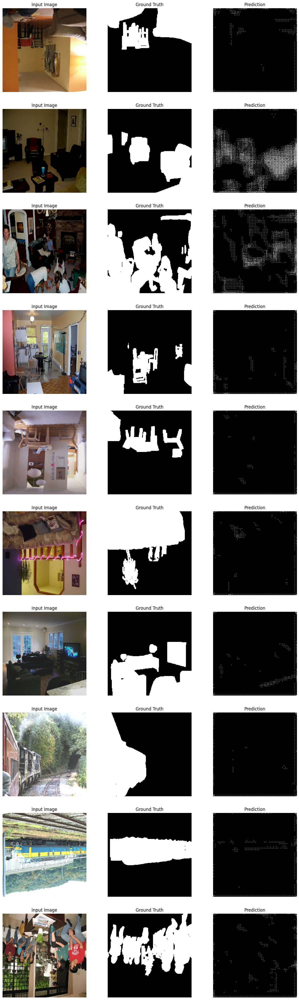

In [75]:
# 예측 결과 시각화 함수
def visualize_predictions(model, dataset):
    for images, masks in dataset.take(1):
        predictions = model.predict(images)
        predictions = tf.argmax(predictions, axis=-1)
        predictions = predictions[..., tf.newaxis]

        fig, axs = plt.subplots(10, 3, figsize=(15, 50))
        for i in range(10):
            axs[i, 0].imshow(images[i].numpy())
            axs[i, 0].set_title('Input Image')
            axs[i, 0].axis('off')

            axs[i, 1].imshow(masks[i].numpy().squeeze(), cmap='gray')
            axs[i, 1].set_title('Ground Truth')
            axs[i, 1].axis('off')

            axs[i, 2].imshow(predictions[i].numpy().squeeze(), cmap='gray')
            axs[i, 2].set_title('Prediction')
            axs[i, 2].axis('off')

        plt.show()

# 예측 결과 시각화
visualize_predictions(model, dataset)
